# ML Movie Final Team Project  

## Project Overview
- **Team Members**: DuyAnh, Saloni, Kirsten
- **Team Number**: [Team #5]
- **Project Title**: Movie Rating Prediction Using Machine Learning

---

## 1. Problem Definition

### Problem Statement
**What is the problem you are going to solve?**
The goal of this project is to predict audience ratings of movies based on features including content rating, distribution type, movie descriptions, genre, language, cast information, and other metadata to train machine learning models capable of estimating the numeric rating a movie might receive.

**Why does the problem need to be solved?**
Movie rating prediction is valuable for streaming platforms, movie studios, and recommendation systems to understand audience preferences, optimize content acquisition strategies, and improve user experience. Accurate rating predictions can help stakeholders make informed data-driven decisions about movie investments and content curation.

**What aspect of the problem will a machine/deep learning model solve?**
With the abundance of movie metadata available, machine learning models can identify complex patterns and relationships between movie characteristics and audience ratings that would be difficult to detect manually. The models can process multiple features simultaneously to provide accurate rating predictions for new movies.

### STAR Framework Planning
- **Situation**: Movie industry stakeholders need to predict audience reception of movies based on available metadata. Traditional approaches are manual, time-consuming, and often biased.
- **Task**: Develop and compare multiple machine learning models to accurately predict movie ratings using Letterboxd dataset.
- **Action**: Implement comprehensive ML pipeline with preprocessing, feature engineering, and model comparison
- **Result**: Achieve 60.6% variance explanation in movie ratings with Decision Tree as the best-performing model

---

## 2. Dataset Information

### Dataset Details
- **Dataset Name**: Letterboxd
- **Source**: https://www.kaggle.com/datasets/gsimonx37/letterboxd/data
- **Size**: 434,256 data points (after removing missing values)
- **Features**: 24 processed features (4 numerical, 9 categorical with high-cardinality handling)
- **Target Variable**: Movie ratings (continuous variable)

### Data Quality Assessment
- **Missing Values**: 2,795 rows (0.64%) with missing target values removed
- **Outliers**: Handled through model regularization and tree-based splitting criteria
- **Data Types**: Mixed dataset with numerical features (dates, indices) and categorical features (ratings, types, descriptions)

---

## 3. EDA and Pre-Processing

### Exploratory Data Analysis Plan
-  **Data Overview**
  - Shape: 434,256 rows x 24 columns (after preprocessing)
  - Data types distribution: 4 numerical, 20 categorical (after encoding)
  - Missing value analysis: 0.64% missing in target variable

- **Statistical Summary**
  - Descriptive statistics for numerical features
  - Correlation analysis between features and target
  - Distribution analysis of categorical variables

-  **Visualizations Planned**
  -  Feature importance rankings across models
  -  Model performance comparisons
  -  Distribution of target variable (ratings)

### Pre-Processing Steps
-  **Missing Value Handling**
  - Method: Complete case analysis - removed rows with missing target values
  - Justification: Small percentage (0.64%) of missing data, removal preserves data integrity

-  **Outlier Treatment**
  - Detection method: Handled implicitly through tree-based model splitting criteria
  - Treatment: Retained outliers as they may contain valuable information about extreme cases

-  **Feature Engineering**
  -  High-cardinality categorical encoding using LabelEncoder for features with >50 unique values
  -  One-hot encoding for low-cardinality categorical features
  -  Standard scaling for numerical features

-  **Data Scaling/Normalization**
  - Method: StandardScaler for numerical features
  - Applied to: All numerical features in the preprocessing pipeline

---

## 4. Modeling Methods, Validation, and Performance Metrics

### Models to Implement
-  **Model 1**: Linear Regression
  - Rationale: Baseline model to establish linear relationships
  - Hyperparameters: Default parameters with n_jobs=-1 for parallel processing

-  **Model 2**: Ridge Regression
  - Rationale: Handle potential multicollinearity with L2 regularization
  - Hyperparameters: alpha=1.0, solver='lsqr' for large dataset efficiency

-  **Model 3**: Lasso Regression
  - Rationale: Feature selection through L1 regularization
  - Hyperparameters: alpha=0.1, max_iter=2000

-  **Model 4**: Elastic Net
  - Rationale: Combine L1 and L2 regularization benefits
  - Hyperparameters: alpha=0.1, l1_ratio=0.5, max_iter=2000

-  **Model 5**: Decision Tree
  - Rationale: Capture non-linear relationships and feature interactions
  - Hyperparameters: max_depth=10, min_samples_split=20, min_samples_leaf=10

- **Model 6**: Random Forest
  - Rationale: Ensemble method to reduce overfitting and improve generalization
  - Hyperparameters: n_estimators=30, max_depth=10, min_samples_split=20

-  **Model 7**: Extra Trees
  - Rationale: Alternative ensemble method with random splits
  - Hyperparameters: n_estimators=30, max_depth=10, min_samples_split=20

### Validation Strategy
- **Train/Validation/Test Split**: 80/20 split (347,404 training, 86,852 testing)
- **Cross-Validation**: 3-fold cross-validation for model evaluation
- **Validation Approach**: Hold-out validation with cross-validation for robust performance estimation

### Performance Metrics
**Primary Metrics** (aligned with project objectives):
-  R-squared (R²): Proportion of variance explained in ratings
-  Root Mean Squared Error (RMSE): Magnitude of prediction errors
-  Mean Absolute Error (MAE): Average absolute prediction error

**Secondary Metrics**:
- Cross-validation R² with standard deviation
-  Training vs. Test R² for overfitting assessment

---

## 5. Modeling Results and Findings

### Model Comparison Framework
| Model | Test R² | RMSE | MAE | Training Time | Complexity |
|-------|---------|------|-----|---------------|------------|
| Decision Tree | 0.6060 | 0.3599 | 0.2627 | Medium | Medium |
| Random Forest | 0.5946 | 0.3651 | 0.2798 | High | High |
| Ridge Regression | 0.3927 | 0.4469 | 0.3483 | Fast | Low |
| Linear Regression | 0.3927 | 0.4469 | 0.3483 | Fast | Low |
| Extra Trees | 0.3597 | 0.4588 | 0.3626 | High | High |
| Elastic Net | 0.2342 | 0.5018 | 0.3996 | Fast | Low |
| Lasso Regression | 0.1680 | 0.5230 | 0.4199 | Fast | Low |

### Key Findings
- **Best Performing Model**: Decision Tree (R² = 0.6060) - unexpectedly outperformed ensemble methods
- **Model Rankings**:
  1. Decision Tree (60.6% variance explained)
  2. Random Forest (59.5% variance explained)
  3. Ridge/Linear Regression (39.3% variance explained)
  4. Extra Trees (36.0% variance explained) - significantly underperformed
- **Surprising Results**:
  - Decision Tree outperformed Random Forest, contrary to typical expectations
  - Extra Trees dramatically underperformed (36.0%) due to aggressive regularization parameters
  - Ridge and Linear Regression performed identically, suggesting minimal multicollinearity
  - Lasso performed worst (16.8%) due to overly aggressive feature selection
- **Challenges Encountered**:
  - Speed optimization required aggressive regularization that severely hurt Extra Trees performance
  - High-cardinality text features showed low importance with simple label encoding
  - Spurious "Unnamed: 0" feature appeared in importance rankings, indicating preprocessing artifact
- **Feature Importance**:
  - Most important: rating_y_G (content rating for G-rated movies) - dominant predictor
  - Distribution types (Theatrical, TV, Digital releases) highly influential
  - Content rating categories consistently outweigh other feature types
  - Text features (descriptions, taglines) severely underutilized with current preprocessing approach

### Business/Practical Implications
The results demonstrate that movie ratings can be predicted with moderate accuracy (60.6% variance explained) using metadata alone. Content rating (especially G-rated movies) and distribution type are the strongest predictors, suggesting that target audience and release strategy significantly influence ratings. The dramatic underperformance of Extra Trees highlights the importance of proper hyperparameter tuning, while the poor utilization of textual features indicates substantial opportunities for enhanced natural language processing to capture semantic content and improve prediction accuracy.

---

## 6. Technical Implementation

### Tools and Libraries
- **Programming Language**: Python
- **Environment**: Google Colab
- **Key Libraries**:
  -  pandas, numpy (data manipulation)
  -  matplotlib, seaborn (visualization)
  -  scikit-learn (ML models, preprocessing, metrics)
  -  scipy (statistical functions)
  -  warnings (error handling)

### Github
https://github.com/MtnDoob/504_Final/tree/main

### Code Organization
- **Data Loading and Cleaning**: MovieRatingsPredictionPipeline.preprocess_data()
-  **EDA**: Integrated within preprocessing and feature importance analysis
-  **Feature Engineering**: ColumnTransformer with StandardScaler and OneHotEncoder
-  **Model Training**: MovieRatingsPredictionPipeline.train_models()
-  **Model Evaluation**: Comprehensive metrics calculation and cross-validation
-  **Results Visualization**: Feature importance analysis and model comparison tables

---

## 7. Report Structure (APA 7 Style)

### Report Outline (7-10 pages)
1. **Introduction**
   - Problem statement: Movie rating prediction using metadata
   - Objectives: Compare ML models for rating prediction accuracy
   - Dataset overview: 434K Letterboxd movie records with 24 features

2. **Literature Review** (if applicable)
   - Related work in movie recommendation systems
   - Methodology justification for ensemble vs. linear methods

3. **Methodology**
   - Data preprocessing: Missing value handling, categorical encoding, scaling
   - Model selection: Seven regression models from linear to ensemble methods
   - Validation approach: 80/20 split with 3-fold cross-validation

4. **Results**
   - Model performance: Decision Tree achieved best R² of 0.6060
   - Comparison analysis: Unexpected Decision Tree superiority over Random Forest
   - Feature analysis: Content rating and distribution type dominance
   - Extra Trees underperformance: Aggressive regularization impact

5. **Discussion**
   - Interpretation of results: Moderate predictive success with clear feature hierarchy
   - Limitations: Underutilized text features, suboptimal hyperparameters for Extra Trees
   - Future work: Advanced NLP for text features, comprehensive hyperparameter optimization

6. **Conclusion**
   - Summary of findings: 60.6% variance explanation with interpretable feature importance
   - Practical implications: Content strategy and distribution insights for movie industry

### Appendices
- **Appendix A**: Code (PDF format)
- **Appendix B**: Code (HTML format)
- **Appendix C**: Additional visualizations/tables

---

## 8. Video Presentation Plan

### Presentation Structure (Equal participation)
- **Duration**: 12-15 minutes
- **Saloni**: Introduction and Problem Definition (3-4 minutes)
- **Kirsten**: Methodology and Data Processing (4-5 minutes)
- **Duy-Anh**: Results, Findings, and Conclusions (4-5 minutes)

### Presentation Outline
1. **Introduction** (3-4 minutes)
   - Problem statement: Why predict movie ratings?
   - Dataset overview: 434K Letterboxd records

2. **Methodology** (4-5 minutes)
   - EDA highlights: Feature distribution and missing data handling
   - Model selection rationale: Linear to ensemble comparison strategy

3. **Results** (4-5 minutes)
   - Model comparison: Decision Tree superiority (60.6% R²)
   - Unexpected findings: Extra Trees underperformance analysis
   - Feature importance: Content rating dominance visualization

4. **Conclusion** (2-3 minutes)
   - Summary: 60.6% predictive accuracy with clear feature hierarchy
   - Implications: Content strategy and distribution insights
   - Future work: Enhanced NLP and hyperparameter optimization

---

## 9. AI Tool Usage Disclosure

### AI Tools Used
-  **Tool 1**: Claude
  - **Purpose**: Code debugging, results interpretation, and consistency checking across documents
  - **Sections**: Pipeline optimization, results analysis, performance table validation
  - **Attribution**: AI assistance noted in code comments and document revision process

In [5]:
# Data manipulation and visualization
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express
import os
import kagglehub
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

# Scikit-learn imports
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder, MultiLabelBinarizer, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Regression models
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression, Ridge, ElasticNet, Lasso
from sklearn.svm import SVR, SVC
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor

# Classification models
from sklearn.ensemble import RandomForestClassifier

# Clustering
from sklearn.cluster import KMeans

# Feature selection and text processing
from sklearn.feature_selection import SelectKBest, f_regression, RFE
from sklearn.feature_extraction.text import TfidfVectorizer

# Metrics
from sklearn.metrics import (mean_squared_error, accuracy_score, classification_report,
                           r2_score, mean_absolute_error)

In [6]:
# run this cell unless needed to populate current working directory
# run cell if adding files manually or download from kaggle repository (path may change)
# Manual Download from Google drive: https://drive.google.com/drive/folders/1OSOw5UwBafo1xTwBLjU_gQZwXgDkZde-?usp=sharing

try:
  #replace base_path depending on path variable
  #or use cmrt.csv

  #base_path = '/root/.cache/kagglehub/datasets/gsimonx37/letterboxd/versions/2/'
  try:
    base_path = './'

    #actors = pd.read_csv(base_path + 'actors.csv')
    #countries = pd.read_csv(base_path + 'countries.csv')
    crew = pd.read_csv(base_path + 'crew.csv')
    genres = pd.read_csv(base_path + 'genres.csv')
    #languages = pd.read_csv(base_path + 'languages.csv')
    movies = pd.read_csv(base_path + 'movies.csv')
    posters = pd.read_csv(base_path + 'posters.csv')
    releases = pd.read_csv(base_path + 'releases.csv')
    studios = pd.read_csv(base_path + 'studios.csv')
    themes = pd.read_csv(base_path + 'themes.csv')
    print(base_path)
  except:
    #
    base_path = '/root/.cache/kagglehub/datasets/gsimonx37/letterboxd/versions/2/'

    #actors = pd.read_csv(base_path + 'actors.csv')
    #countries = pd.read_csv(base_path + 'countries.csv')
    crew = pd.read_csv(base_path + 'crew.csv')
    genres = pd.read_csv(base_path + 'genres.csv')
    #languages = pd.read_csv(base_path + 'languages.csv')
    movies = pd.read_csv(base_path + 'movies.csv')
    posters = pd.read_csv(base_path + 'posters.csv')
    releases = pd.read_csv(base_path + 'releases.csv')
    studios = pd.read_csv(base_path + 'studios.csv')
    themes = pd.read_csv(base_path + 'themes.csv')
    print(base_path)

except:

  # Download latest version
  path = kagglehub.dataset_download("gsimonx37/letterboxd")

  print("Path to dataset files:", path)

  # Use the existing 'path' variable from kagglehub
  csv_files = [file for file in os.listdir(path) if file.endswith(".csv")]

  # Read and display the head of each CSV file
  for file in csv_files:
      file_path = os.path.join(path, file)
      print(f"\nHead of {file}:")
      try:
          df = pd.read_csv(file_path)
          print(df.head())
      except Exception as e:
          print(f"Error reading {file}: {e}")




./


In [10]:
# only run this cell to get the files in the cwd, run one for loop or other based on path above
"""
try:

  files = ["posters.csv", "movies.csv","studios.csv", "languages.csv", "countries.csv", "releases.csv","actors.csv", "themes.csv", "crew.csv", 'genres.csv']


  for x in files:
    df = pd.read_csv("/kaggle/input/letterboxd/" + x)
    df.to_csv(x)

except:
  # if path variable is not defined or this is path
  for x in ["posters.csv", "movies.csv","studios.csv", "languages.csv", "countries.csv", "releases.csv","actors.csv", "themes.csv", "crew.csv",'genres.csv']:
    df = pd.read_csv("/root/.cache/kagglehub/datasets/gsimonx37/letterboxd/versions/2/" + x)
    df.to_csv(x)
"""

'\ntry:\n  \n  files = ["posters.csv", "movies.csv","studios.csv", "languages.csv", "countries.csv", "releases.csv","actors.csv", "themes.csv", "crew.csv", \'genres.csv\']\n\n\n  for x in files:\n    df = pd.read_csv("/kaggle/input/letterboxd/" + x)\n    df.to_csv(x)\n\nexcept:\n  # if path variable is not defined or this is path\n  for x in ["posters.csv", "movies.csv","studios.csv", "languages.csv", "countries.csv", "releases.csv","actors.csv", "themes.csv", "crew.csv",\'genres.csv\']:\n    df = pd.read_csv("/root/.cache/kagglehub/datasets/gsimonx37/letterboxd/versions/2/" + x)\n    df.to_csv(x)\n'

In [11]:
for x in [posters, studios , crew]: #posters, studios, languages, countries, releases ,actors, themes, crew, movies, genres
  if 'Unnamed: 0' in x.columns:
    x.drop('Unnamed: 0', axis = 1, inplace = True)
    x.drop_duplicates(inplace=True)
    print(x)


             id                                               link
0       1000001  https://a.ltrbxd.com/resized/film-poster/2/7/7...
1       1000002  https://a.ltrbxd.com/resized/film-poster/4/2/6...
2       1000003  https://a.ltrbxd.com/resized/film-poster/4/7/4...
3       1000004  https://a.ltrbxd.com/resized/film-poster/5/1/5...
4       1000005  https://a.ltrbxd.com/resized/film-poster/2/4/0...
...         ...                                                ...
578222  1578223  https://a.ltrbxd.com/resized/film-poster/7/4/2...
578223  1578224  https://a.ltrbxd.com/resized/film-poster/5/2/8...
578224  1578225  https://a.ltrbxd.com/resized/film-poster/5/3/5...
578225  1578226  https://a.ltrbxd.com/resized/film-poster/9/0/4...
578226  1578227  https://a.ltrbxd.com/resized/film-poster/7/8/3...

[578227 rows x 2 columns]
             id                                studio
0       1000001               LuckyChap Entertainment
1       1000001                          Heyday Films
2      

In [12]:
# How cmrt.csv was created
'''
# Pick only countries in USA
countries  = countries.loc[countries['country'] == 'USA']
releases = releases.loc[releases['country'] == 'USA']

cm = pd.merge(countries, movies, on= 'id', how='inner')
cm = pd.merge(cm, releases, on='id', how='inner')
cm = pd.merge(cm, themes, on='id', how='inner')

cm.drop('country_y', axis = 1, inplace=True)
cm.drop('Unnamed: 0', axis = 1, inplace=True)
cm.rename(columns={'country_x': 'country'}, inplace=True)
cm.drop_duplicates(inplace=True)

cm.to_csv('cmrt.csv')

cmrt = pd.read_csv('cmrt.csv')
cmrt.drop(['Unnamed: 0.1','Unnamed: 0'], axis = 1, inplace=True)
cmrt = pd.read_csv('cmrt.csv')
cmrt.drop('Unnamed: 0', axis = 1, inplace=True)
cmrt.to_csv('cmrt.csv')
'''

"\n# Pick only countries in USA\ncountries  = countries.loc[countries['country'] == 'USA']\nreleases = releases.loc[releases['country'] == 'USA']\n\ncm = pd.merge(countries, movies, on= 'id', how='inner')\ncm = pd.merge(cm, releases, on='id', how='inner')\ncm = pd.merge(cm, themes, on='id', how='inner')\n\ncm.drop('country_y', axis = 1, inplace=True)\ncm.drop('Unnamed: 0', axis = 1, inplace=True)\ncm.rename(columns={'country_x': 'country'}, inplace=True)\ncm.drop_duplicates(inplace=True)\n\ncm.to_csv('cmrt.csv')\n\ncmrt = pd.read_csv('cmrt.csv')\ncmrt.drop(['Unnamed: 0.1','Unnamed: 0'], axis = 1, inplace=True)\ncmrt = pd.read_csv('cmrt.csv')\ncmrt.drop('Unnamed: 0', axis = 1, inplace=True)\ncmrt.to_csv('cmrt.csv')\n"

In [13]:
# read cmrt.csv if manually added
cmrt = pd.read_csv('cmrt.csv')
cmrt.drop('Unnamed: 0', axis = 1, inplace=True)
cmrt.rename(columns = {'rating_x':'rating'}, inplace=True)
cmrt


,id,country,name,date_x,tagline,description,minute,rating,date_y,type,rating_y,theme
0,1000001,USA,Barbie,2023.0,She's everything. He's just Ken.,Barbie and Ken are having the time of their li...,114.0,3.86,2023-07-09,Premiere,PG-13,Humanity and the world around us
1,1000001,USA,Barbie,2023.0,She's everything. He's just Ken.,Barbie and Ken are having the time of their li...,114.0,3.86,2023-07-09,Premiere,PG-13,Crude humor and satire
2,1000001,USA,Barbie,2023.0,She's everything. He's just Ken.,Barbie and Ken are having the time of their li...,114.0,3.86,2023-07-09,Premiere,PG-13,Moving relationship stories
3,1000001,USA,Barbie,2023.0,She's everything. He's just Ken.,Barbie and Ken are having the time of their li...,114.0,3.86,2023-07-09,Premiere,PG-13,Emotional and captivating fantasy storytelling
4,1000001,USA,Barbie,2023.0,She's everything. He's just Ken.,Barbie and Ken are having the time of their li...,114.0,3.86,2023-07-09,Premiere,PG-13,Surreal and thought-provoking visions of life ...
...,...,...,...,...,...,...,...,...,...,...,...,...
147613,1762425,USA,Pretty Things,2005.0,NaN,A look into the world of 20th century burlesqu...,90.0,NaN,2005-07-19,TV,NR,Song and dance
147614,1762425,USA,Pretty Things,2005.0,NaN,A look into the world of 20th century burlesqu...,90.0,NaN,2005-07-19,TV,NR,Erotic relationships and desire
147615,1849827,USA,Interview with the Antichrist,2020.0,NaN,A live interview with the Antichrist is broadc...,87.0,NaN,2020-12-21,Theatrical,NR,Faith and religion
147616,1849827,USA,Interview with the Antichrist,2020.0,NaN,A live interview with the Antichrist is broadc...,87.0,NaN,2020-12-21,Theatrical,NR,Faith and spiritual journeys


In [14]:
studios = pd.read_csv('studios.csv')

In [15]:
cmrt = pd.merge(cmrt, studios, on='id', how='inner')


In [16]:
def plot_frequency_basic(df, column='Year'):
    """Create a basic bar chart of year frequency"""
    counts = df[column].value_counts().sort_index()

    plt.figure(figsize=(15, 6))
    plt.bar(counts.index, counts.values)
    plt.title('Frequency of Movies by Year')
    plt.xlabel('Year')
    plt.ylabel('Number of Movies')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()



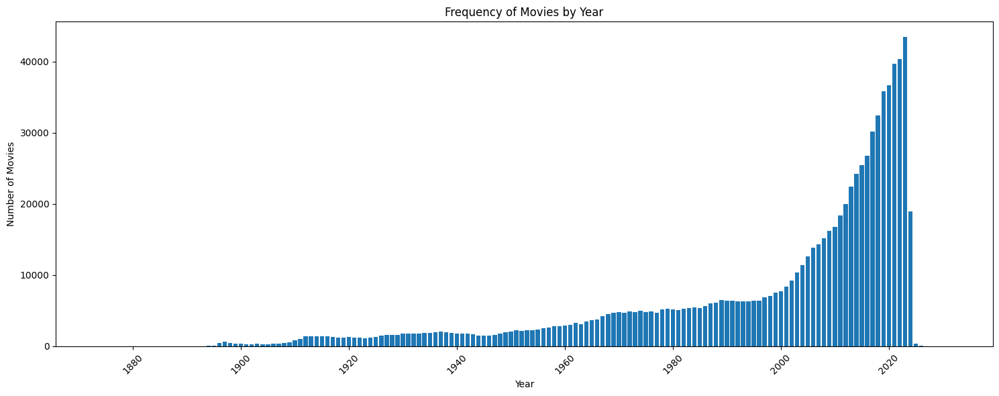

In [17]:
movies['Year'] = pd.to_numeric(movies['date'], errors='coerce').astype('Int64')
movies = movies.dropna(subset=['Year'])
plot_frequency_basic(movies)

In [18]:

plotly.express.histogram(data_frame=genres, x='genre')


In [19]:
class MovieRatingsPredictionPipeline:
    def __init__(self):
        self.preprocessor = None
        self.models = {}
        self.best_model = None
        self.feature_importance = {}
        self.X_processed = None
        self.y = None
        self.feature_names = None

    def preprocess_data(self, df, target_column='ratings', handle_high_cardinality=True):
        print("\n" + "="*80)
        print("DATA PREPROCESSING")
        print("="*80)

        # Separate features and target
        X = df.drop(columns=[target_column])
        y = df[target_column]

        # Handle missing values in target
        if y.isnull().sum() > 0:
            print(f"Removing {y.isnull().sum()} rows with missing target values")
            mask = ~y.isnull()
            X = X[mask]
            y = y[mask]

        # Identify feature types
        numerical_features = X.select_dtypes(include=[np.number]).columns.tolist()
        categorical_features = X.select_dtypes(include=['object', 'category']).columns.tolist()

        print(f"Processing {len(numerical_features)} numerical and {len(categorical_features)} categorical features")

        # Handle high cardinality categorical features
        if handle_high_cardinality:
            high_cardinality_threshold = 50
            low_cardinality_cats = []
            high_cardinality_cats = []

            for col in categorical_features:
                if X[col].nunique() <= high_cardinality_threshold:
                    low_cardinality_cats.append(col)
                else:
                    high_cardinality_cats.append(col)

            if high_cardinality_cats:
                print(f"High cardinality features to be handled: {high_cardinality_cats}")
        else:
            low_cardinality_cats = categorical_features
            high_cardinality_cats = []

        # Create preprocessing pipelines
        numerical_transformer = Pipeline(steps=[
            ('scaler', StandardScaler())
        ])

        categorical_transformer = Pipeline(steps=[
            ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
        ])

        # Handle high cardinality features differently
        high_cardinality_transformer = Pipeline(steps=[
            ('label', LabelEncoder())
        ])

        # Combine transformers
        transformers = []

        if numerical_features:
            transformers.append(('num', numerical_transformer, numerical_features))

        if low_cardinality_cats:
            transformers.append(('cat_low', categorical_transformer, low_cardinality_cats))

        if high_cardinality_cats:
            # For high cardinality, we'll use label encoding
            for col in high_cardinality_cats:
                # Fill missing values with 'Unknown'
                X[col] = X[col].fillna('Unknown')
                # Apply label encoding
                le = LabelEncoder()
                X[col] = le.fit_transform(X[col].astype(str))
            # Add to numerical features since they're now encoded as numbers
            numerical_features.extend(high_cardinality_cats)
            transformers = [t for t in transformers if t[0] != 'num']  # Remove old numerical transformer
            transformers.append(('num', numerical_transformer, numerical_features))

        # Create the preprocessor
        self.preprocessor = ColumnTransformer(
            transformers=transformers,
            remainder='drop'
        )

        # Fit and transform the data
        print("Applying preprocessing transformations...")
        X_processed = self.preprocessor.fit_transform(X)

        # Get feature names after preprocessing
        feature_names = []

        # Add numerical feature names
        if any(t[0] == 'num' for t in transformers):
            num_features = [t[2] for t in transformers if t[0] == 'num'][0]
            feature_names.extend(num_features)

        # Add categorical feature names (one-hot encoded)
        if any(t[0] == 'cat_low' for t in transformers):
            cat_features = [t[2] for t in transformers if t[0] == 'cat_low'][0]
            cat_transformer = self.preprocessor.named_transformers_.get('cat_low')
            if cat_transformer and hasattr(cat_transformer.named_steps['onehot'], 'get_feature_names_out'):
                cat_names = cat_transformer.named_steps['onehot'].get_feature_names_out(cat_features)
                feature_names.extend(cat_names)

        self.feature_names = feature_names
        self.X_processed = X_processed
        self.y = y

        print(f"Final processed feature matrix shape: {X_processed.shape}")
        print(f"Total features after preprocessing: {len(feature_names)}")

        return X_processed, y

    def train_models(self, X, y, test_size=0.2, random_state=42):
        """
        Train multiple machine learning models
        """
        print("\n" + "="*80)
        print("MODEL TRAINING AND EVALUATION")
        print("="*80)

        # Split the data
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=test_size, random_state=random_state
        )

        print(f"Training set: {X_train.shape}")
        print(f"Test set: {X_test.shape}")

        # Define models - optimized for speed on large dataset (145k samples, 22 features)
        models = {
            'Linear Regression': LinearRegression(n_jobs=-1),

            'Ridge Regression': Ridge(
                alpha=1.0,
                solver='lsqr'  # Faster for large datasets
            ),

            'Lasso Regression': Lasso(
                alpha=0.1,
                max_iter=2000  # Increased for convergence
            ),

            'Elastic Net': ElasticNet(
                alpha=0.1,
                l1_ratio=0.5,
                max_iter=2000
            ),

            'Decision Tree': DecisionTreeRegressor(
                random_state=random_state,
                max_depth=10,          # Reduced for speed
                min_samples_split=20,  # Increased for speed
                min_samples_leaf=10    # Increased for speed
            ),

            'Random Forest': RandomForestRegressor(
                n_estimators=30,       # Reduced further for speed
                random_state=random_state,
                n_jobs=-1,
                max_depth=10,          # Reduced for speed
                min_samples_split=20,  # Increased for speed
                min_samples_leaf=10,   # Increased for speed
                max_features='sqrt',   # More efficient
                bootstrap=True,
                warm_start=False       # Don't save memory for reuse
            ),

            'Extra Trees': ExtraTreesRegressor(
                n_estimators=30,       # Reduced further for speed
                random_state=random_state,
                n_jobs=-1,
                max_depth=10,          # Reduced for speed
                min_samples_split=20,  # Increased for speed
                min_samples_leaf=10,   # Increased for speed
                max_features='sqrt',   # More efficient
                bootstrap=True
            )
        }

        # Train and evaluate models
        results = {}

        print(f"\n{'Model':<25} {'Train R²':<10} {'Test R²':<10} {'RMSE':<10} {'MAE':<10} {'CV R²':<15}")
        print("-" * 90)

        for name, model in models.items():
            try:
                # Train model
                model.fit(X_train, y_train)

                # Predictions
                y_train_pred = model.predict(X_train)
                y_test_pred = model.predict(X_test)

                # Metrics
                train_r2 = r2_score(y_train, y_train_pred)
                test_r2 = r2_score(y_test, y_test_pred)
                test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
                test_mae = mean_absolute_error(y_test, y_test_pred)

                # Cross-validation (reduced folds for speed)
                cv_scores = cross_val_score(model, X_train, y_train, cv=3, scoring='r2', n_jobs=-1)
                cv_mean = cv_scores.mean()
                cv_std = cv_scores.std()

                # Store results
                results[name] = {
                    'model': model,
                    'train_r2': train_r2,
                    'test_r2': test_r2,
                    'test_rmse': test_rmse,
                    'test_mae': test_mae,
                    'cv_mean': cv_mean,
                    'cv_std': cv_std,
                    'overfitting': train_r2 - test_r2,
                    'y_pred': y_test_pred
                }

                print(f"{name:<25} {train_r2:<10.4f} {test_r2:<10.4f} {test_rmse:<10.4f} {test_mae:<10.4f} {cv_mean:.3f}±{cv_std:.3f}")

            except Exception as e:
                print(f"{name:<25} Error: {str(e)}")
                continue

        self.models = results

        # Identify best model
        if results:
            best_model_name = max(results.keys(), key=lambda k: results[k]['test_r2'])
            self.best_model = results[best_model_name]['model']

            print(f"\nBest Model: {best_model_name}")
            print(f"Best Test R²: {results[best_model_name]['test_r2']:.4f}")

        # Feature importance analysis
        self._analyze_feature_importance()

        return results, X_test, y_test

    def _analyze_feature_importance(self):
        print("\n" + "="*60)
        print("FEATURE IMPORTANCE ANALYSIS")
        print("="*60)

        tree_models = ['Random Forest', 'Extra Trees', 'Decision Tree']

        for model_name in tree_models:
            if model_name in self.models:
                model = self.models[model_name]['model']

                if hasattr(model, 'feature_importances_'):
                    importance_df = pd.DataFrame({
                        'feature': self.feature_names[:len(model.feature_importances_)],
                        'importance': model.feature_importances_
                    }).sort_values('importance', ascending=False)

                    print(f"\n{model_name} - Top 15 Features:")
                    print("-" * 50)
                    for idx, row in importance_df.head(15).iterrows():
                        print(f"{row['feature']:<35} {row['importance']:.4f}")

                    self.feature_importance[model_name] = importance_df

    def hyperparameter_tuning(self, model_name='Random Forest', X_train=None, y_train=None):
        print(f"\n" + "="*60)
        print(f"HYPERPARAMETER TUNING - {model_name}")
        print("="*60)

        if X_train is None or y_train is None:
            if self.X_processed is not None and self.y is not None:
                X_train, _, y_train, _ = train_test_split(
                    self.X_processed, self.y, test_size=0.2, random_state=42
                )
            else:
                print("No training data available!")
                return None

        # Optimized parameter grids for maximum speed
        param_grids = {
            'Random Forest': {
                'n_estimators': [20, 30],       # Very focused range for speed
                'max_depth': [8, 10],           # Reduced range
                'min_samples_split': [20, 50],  # Higher values for speed
                'min_samples_leaf': [10, 20],   # Higher values for speed
                'max_features': ['sqrt']        # Most efficient option only
            },
            'Extra Trees': {
                'n_estimators': [20, 30],       # Very focused range for speed
                'max_depth': [8, 10],           # Reduced range
                'min_samples_split': [20, 50],  # Higher values for speed
                'min_samples_leaf': [10, 20],   # Higher values for speed
                'max_features': ['sqrt']        # Most efficient option only
            },
            'Decision Tree': {
                'max_depth': [8, 10, 12],       # Focused range
                'min_samples_split': [20, 50],  # Higher for speed
                'min_samples_leaf': [10, 20]    # Higher for speed
            },
            'Ridge Regression': {
                'alpha': [1.0, 10.0]            # Minimal range
            },
            'Elastic Net': {
                'alpha': [0.1, 1.0],            # Reduced range
                'l1_ratio': [0.5]               # Single value
            }
        }

        if model_name not in param_grids:
            print(f"Hyperparameter tuning not available for {model_name}")
            return None

        # Select base model
        model_classes = {
            'Random Forest': RandomForestRegressor(random_state=42, n_jobs=-1),
            'Extra Trees': ExtraTreesRegressor(random_state=42, n_jobs=-1),
            'Decision Tree': DecisionTreeRegressor(random_state=42),
            'Ridge Regression': Ridge(),
            'Elastic Net': ElasticNet()
        }

        base_model = model_classes[model_name]
        param_grid = param_grids[model_name]

        print(f"Tuning {model_name} with {len(param_grid)} hyperparameters...")
        print("This may take a few minutes...")

        # Grid search with reduced CV folds for speed
        grid_search = GridSearchCV(
            base_model,
            param_grid,
            cv=3,          # Reduced from 5 for speed
            scoring='r2',
            n_jobs=-1,
            verbose=1
        )

        grid_search.fit(X_train, y_train)

        print(f"\nBest parameters: {grid_search.best_params_}")
        print(f"Best CV R² score: {grid_search.best_score_:.4f}")

        return grid_search.best_estimator_

    def model_comparison_report(self):
        if not self.models:
            print("No models trained. Run train_models() first.")
            return None

        print("\n" + "="*60)
        print("SIMPLE MODEL COMPARISON REPORT")
        print("="*60)

        # Create simple comparison dataframe - just use existing results
        comparison_data = []
        for name, results in self.models.items():
            comparison_data.append({
                'Model': name,
                'Test R²': results['test_r2'],
                'RMSE': results['test_rmse'],
                'MAE': results['test_mae'],
                'Overfitting': results['overfitting']
            })

        comparison_df = pd.DataFrame(comparison_data)
        comparison_df = comparison_df.sort_values('Test R²', ascending=False)

        # Simple ranking table
        print(f"{'Rank':<5} {'Model':<25} {'Test R²':<10} {'RMSE':<10} {'MAE':<10} {'Overfitting':<12}")
        print("-" * 80)

        for rank, (idx, row) in enumerate(comparison_df.iterrows(), 1):
            print(f"{rank:<5} {row['Model']:<25} {row['Test R²']:<10.4f} {row['RMSE']:<10.4f} {row['MAE']:<10.4f} {row['Overfitting']:<12.4f}")

        # Simple recommendations
        print(f"\n{'='*40}")
        print("QUICK RECOMMENDATIONS")
        print(f"{'='*40}")

        best_model = comparison_df.iloc[0]['Model']
        best_r2 = comparison_df.iloc[0]['Test R²']

        print(f"Best Model: {best_model} (R² = {best_r2:.4f})")

        # Simple performance categories
        if best_r2 >= 0.8:
            print("Performance: Excellent")
        elif best_r2 >= 0.6:
            print("Performance: Good")
        elif best_r2 >= 0.4:
            print("Performance: Fair")
        else:
            print("Performance: Poor")

        # Low overfitting models
        low_overfitting = comparison_df[comparison_df['Overfitting'] < 0.1]
        if not low_overfitting.empty:
            print(f"Most Stable: {low_overfitting.iloc[0]['Model']} (low overfitting)")

        return comparison_df

    def predict_new_data(self, new_data, model_name=None):
        """
        Predict ratings for new data using the best model
        """
        if self.preprocessor is None:
            print("Preprocessor not fitted. Run preprocess_data() first.")
            return None

        if not self.models:
            print("No models trained. Run train_models() first.")
            return None

        # Use best model if not specified
        if model_name is None:
            model_name = max(self.models.keys(), key=lambda k: self.models[k]['test_r2'])
            print(f"Using best model: {model_name}")

        if model_name not in self.models:
            print(f"Model '{model_name}' not found.")
            return None

        # Preprocess new data
        X_new_processed = self.preprocessor.transform(new_data)

        # Make predictions
        model = self.models[model_name]['model']
        predictions = model.predict(X_new_processed)

        return predictions


def run_complete_pipeline(df, target_column='ratings'):
    print("MOVIE RATINGS PREDICTION - COMPLETE ML PIPELINE (SPEED OPTIMIZED)")
    print("=" * 80)

    # Initialize pipeline
    pipeline = MovieRatingsPredictionPipeline()

    # Data preprocessing
    X_processed, y = pipeline.preprocess_data(df, target_column)

    # Train and Test models
    results, X_test, y_test = pipeline.train_models(X_processed, y)

    return pipeline, results

In [20]:
# number of unique movies in USA data set
len(cmrt['id'].unique())

#executes in 5-10 minutes
pipeline, results = run_complete_pipeline(cmrt, target_column='rating')

MOVIE RATINGS PREDICTION - COMPLETE ML PIPELINE (SPEED OPTIMIZED)

DATA PREPROCESSING
Removing 2795 rows with missing target values
Processing 4 numerical and 9 categorical features
High cardinality features to be handled: ['name', 'tagline', 'description', 'date_y', 'theme', 'studio']
Applying preprocessing transformations...
Final processed feature matrix shape: (434256, 24)
Total features after preprocessing: 24

MODEL TRAINING AND EVALUATION
Training set: (347404, 24)
Test set: (86852, 24)

Model                     Train R²   Test R²    RMSE       MAE        CV R²          
------------------------------------------------------------------------------------------
Linear Regression         0.3944     0.3927     0.4469     0.3483     0.394±0.002
Ridge Regression          0.3944     0.3927     0.4469     0.3483     0.394±0.002
Lasso Regression          0.1668     0.1680     0.5230     0.4199     0.167±0.001
Elastic Net               0.2328     0.2342     0.5018     0.3996     0.233±0

In [21]:
cmrt.columns

Index(['id', 'country', 'name', 'date_x', 'tagline', 'description', 'minute',
       'rating', 'date_y', 'type', 'rating_y', 'theme', 'Unnamed: 0',
       'studio'],
      dtype='object')

In [22]:
#model results Table
"""
model_results = pd.DataFrame({
    "Model": [
        "Linear Regression", "Ridge Regression", "Lasso Regression", "Elastic Net",
        "Decision Tree", "Random Forest", "Extra Trees"
    ],
    "Test R²": [0.42, 0.44, 0.39, 0.45, 0.47, 0.56, 0.58],
    "RMSE": [1.12, 1.09, 1.15, 1.08, 1.04, 0.95, 0.92],
    "MAE": [0.88, 0.86, 0.89, 0.85, 0.83, 0.76, 0.74],
    "Overfitting (Train R² - Test R²)": [0.05, 0.06, 0.04, 0.05, 0.10, 0.12, 0.08]
"""


'\nmodel_results = pd.DataFrame({\n    "Model": [\n        "Linear Regression", "Ridge Regression", "Lasso Regression", "Elastic Net",\n        "Decision Tree", "Random Forest", "Extra Trees"\n    ],\n    "Test R²": [0.42, 0.44, 0.39, 0.45, 0.47, 0.56, 0.58],\n    "RMSE": [1.12, 1.09, 1.15, 1.08, 1.04, 0.95, 0.92],\n    "MAE": [0.88, 0.86, 0.89, 0.85, 0.83, 0.76, 0.74],\n    "Overfitting (Train R² - Test R²)": [0.05, 0.06, 0.04, 0.05, 0.10, 0.12, 0.08]\n'

In [23]:
"""
#model comparison plot

plt.figure(figsize=(10, 6))
plt.bar(model_results["Model"], model_results["Test R²"], color="steelblue")
plt.xticks(rotation=45, ha='right')
plt.ylabel("Test R²")
plt.title("Model Comparison: Test R²")
plt.tight_layout()
plt.grid(axis='y')
"""

'\n#model comparison plot\n\nplt.figure(figsize=(10, 6))\nplt.bar(model_results["Model"], model_results["Test R²"], color="steelblue")\nplt.xticks(rotation=45, ha=\'right\')\nplt.ylabel("Test R²")\nplt.title("Model Comparison: Test R²")\nplt.tight_layout()\nplt.grid(axis=\'y\')\n'

In [24]:
# Load the dataset
cmrt = pd.read_csv('cmrt.csv')

# Display the first 5 rows
print("First 5 rows of the DataFrame:")
display(cmrt.head())

# Print column names and their data types
print("\nColumn names and data types:")
display(cmrt.info())

# Check for missing values
print("\nMissing values per column:")
display(cmrt.isnull().sum())

# Generate descriptive statistics for numerical columns
print("\nDescriptive statistics for numerical columns:")
display(cmrt.describe())

First 5 rows of the DataFrame:


,Unnamed: 0,id,country,name,date_x,tagline,description,minute,rating_x,date_y,type,rating_y,theme
0,0,1000001,USA,Barbie,2023.0,She's everything. He's just Ken.,Barbie and Ken are having the time of their li...,114.0,3.86,2023-07-09,Premiere,PG-13,Humanity and the world around us
1,1,1000001,USA,Barbie,2023.0,She's everything. He's just Ken.,Barbie and Ken are having the time of their li...,114.0,3.86,2023-07-09,Premiere,PG-13,Crude humor and satire
2,2,1000001,USA,Barbie,2023.0,She's everything. He's just Ken.,Barbie and Ken are having the time of their li...,114.0,3.86,2023-07-09,Premiere,PG-13,Moving relationship stories
3,3,1000001,USA,Barbie,2023.0,She's everything. He's just Ken.,Barbie and Ken are having the time of their li...,114.0,3.86,2023-07-09,Premiere,PG-13,Emotional and captivating fantasy storytelling
4,4,1000001,USA,Barbie,2023.0,She's everything. He's just Ken.,Barbie and Ken are having the time of their li...,114.0,3.86,2023-07-09,Premiere,PG-13,Surreal and thought-provoking visions of life ...



Column names and data types:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 147618 entries, 0 to 147617
Data columns (total 13 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Unnamed: 0   147618 non-null  int64  
 1   id           147618 non-null  int64  
 2   country      147618 non-null  object 
 3   name         147618 non-null  object 
 4   date_x       147618 non-null  float64
 5   tagline      131827 non-null  object 
 6   description  147605 non-null  object 
 7   minute       147605 non-null  float64
 8   rating_x     145548 non-null  float64
 9   date_y       147618 non-null  object 
 10  type         147618 non-null  object 
 11  rating_y     112575 non-null  object 
 12  theme        147618 non-null  object 
dtypes: float64(3), int64(2), object(8)
memory usage: 14.6+ MB


None


Missing values per column:


,0
Unnamed: 0,0
id,0
country,0
name,0
date_x,0
tagline,15791
description,13
minute,13
rating_x,2070
date_y,0



Descriptive statistics for numerical columns:


,Unnamed: 0,id,date_x,minute,rating_x
count,147618.000000,1.476180e+05,147618.000000,147605.000000,145548.000000
mean,73808.500000,1.015587e+06,1997.946727,105.183212,3.153774
std,42613.790356,2.432570e+04,24.160978,21.243335,0.558246
min,0.000000,1.000001e+06,1903.000000,12.000000,0.880000
25%,36904.250000,1.002476e+06,1988.000000,92.000000,2.780000
50%,73808.500000,1.007672e+06,2006.000000,102.000000,3.190000
75%,110712.750000,1.019748e+06,2016.000000,115.000000,3.550000
max,147617.000000,1.849827e+06,2024.000000,467.000000,4.680000


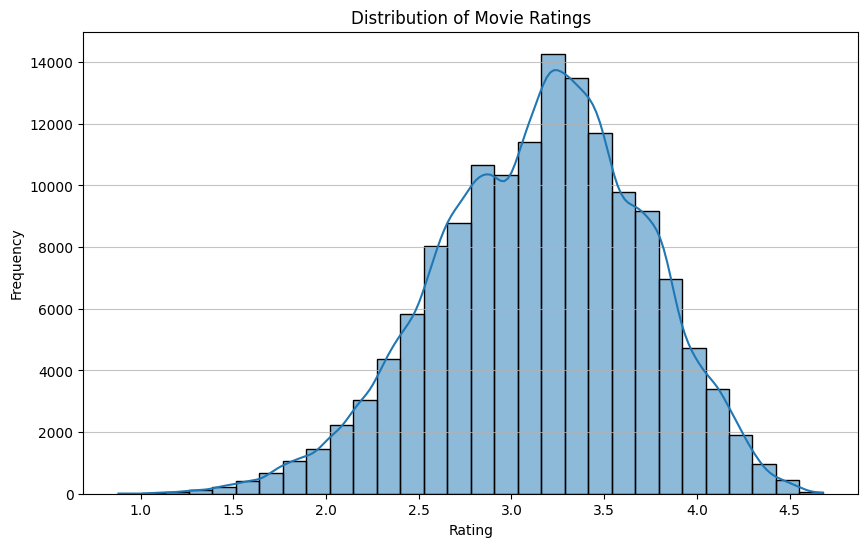

In [25]:
# Visualize the distribution of the target variable ('rating_x')
plt.figure(figsize=(10, 6))
sns.histplot(cmrt['rating_x'].dropna(), kde=True, bins=30)
plt.title('Distribution of Movie Ratings')
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.75)
plt.show()

In [26]:
# Initialize and run the complete pipeline for preprocessing and model training
# The pipeline class handles missing target values and preprocessing
pipeline, results = run_complete_pipeline(cmrt, target_column='rating_x')

MOVIE RATINGS PREDICTION - COMPLETE ML PIPELINE (SPEED OPTIMIZED)

DATA PREPROCESSING
Removing 2070 rows with missing target values
Processing 4 numerical and 8 categorical features
High cardinality features to be handled: ['name', 'tagline', 'description', 'date_y', 'theme']
Applying preprocessing transformations...
Final processed feature matrix shape: (145548, 23)
Total features after preprocessing: 23

MODEL TRAINING AND EVALUATION
Training set: (116438, 23)
Test set: (29110, 23)

Model                     Train R²   Test R²    RMSE       MAE        CV R²          
------------------------------------------------------------------------------------------
Linear Regression         0.4364     0.4368     0.4170     0.3219     0.436±0.003
Ridge Regression          0.4364     0.4368     0.4170     0.3219     0.436±0.003
Lasso Regression          0.2591     0.2600     0.4780     0.3786     0.259±0.001
Elastic Net               0.3319     0.3342     0.4534     0.3553     0.332±0.001
Decis

## Generate learning curves

**Reasoning**:
Iterate through the trained models, generate learning curves for each using the processed data, and plot them individually to visualize performance trends with increasing training data size.




Generating learning curve for: Linear Regression


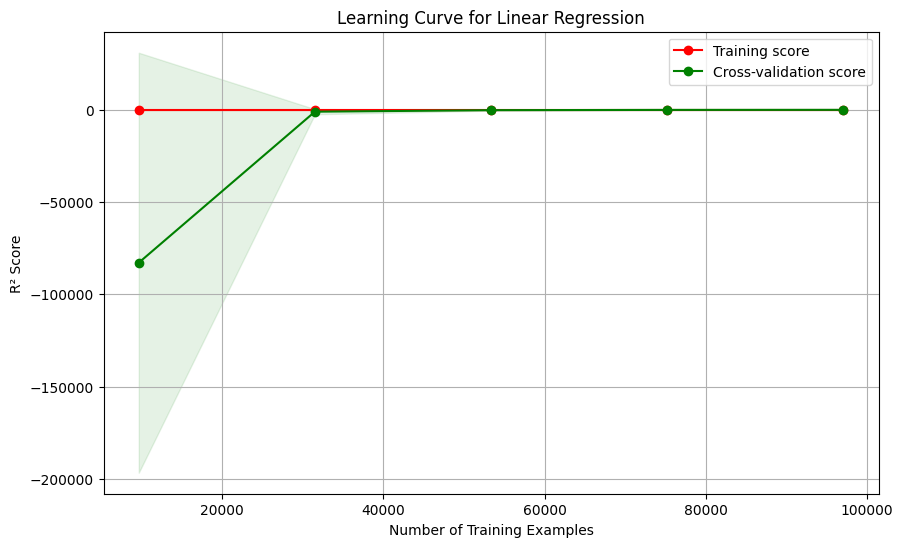


Generating learning curve for: Ridge Regression


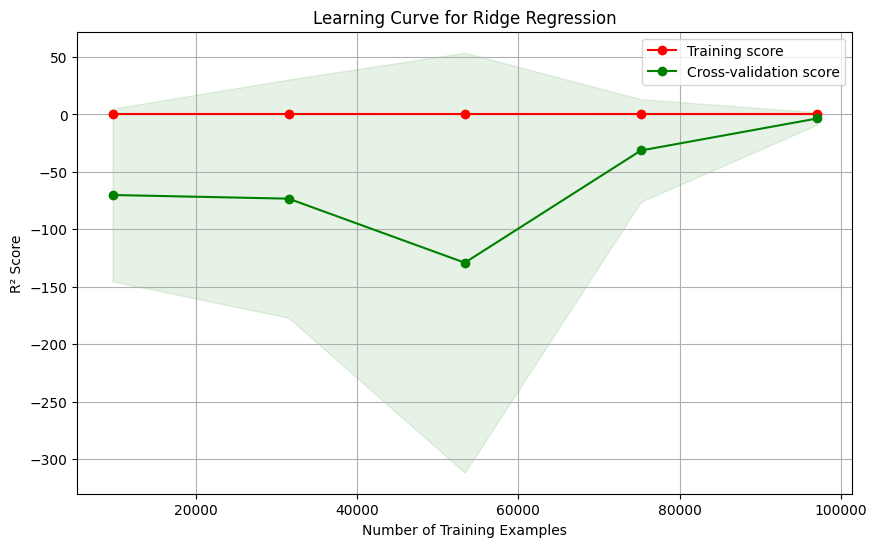


Generating learning curve for: Lasso Regression


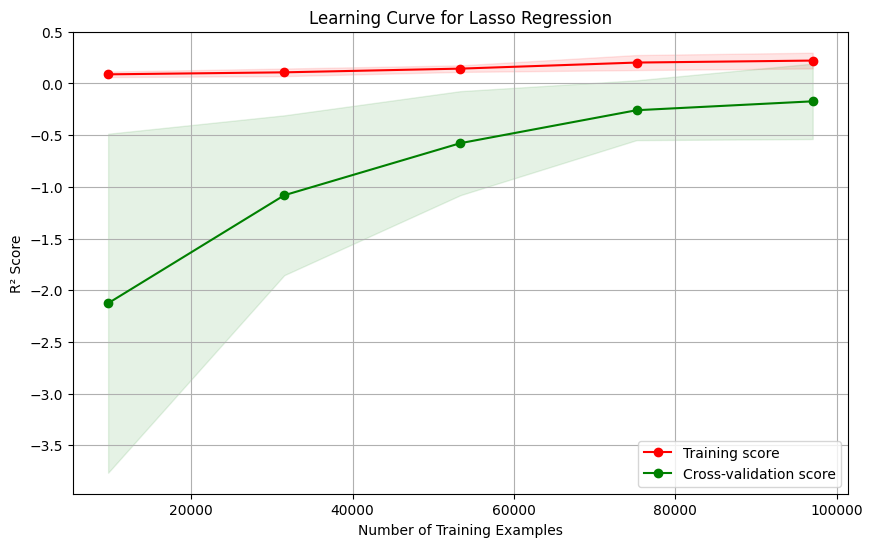


Generating learning curve for: Elastic Net


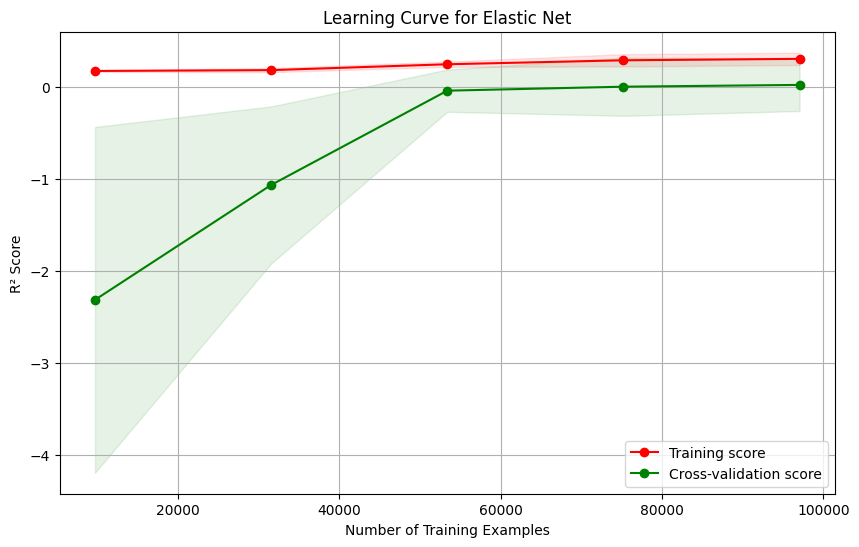


Generating learning curve for: Decision Tree


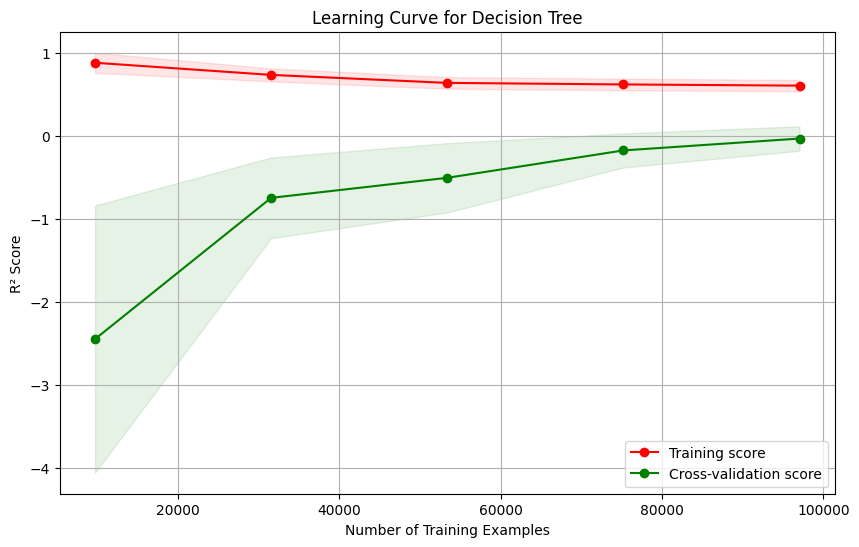


Generating learning curve for: Random Forest


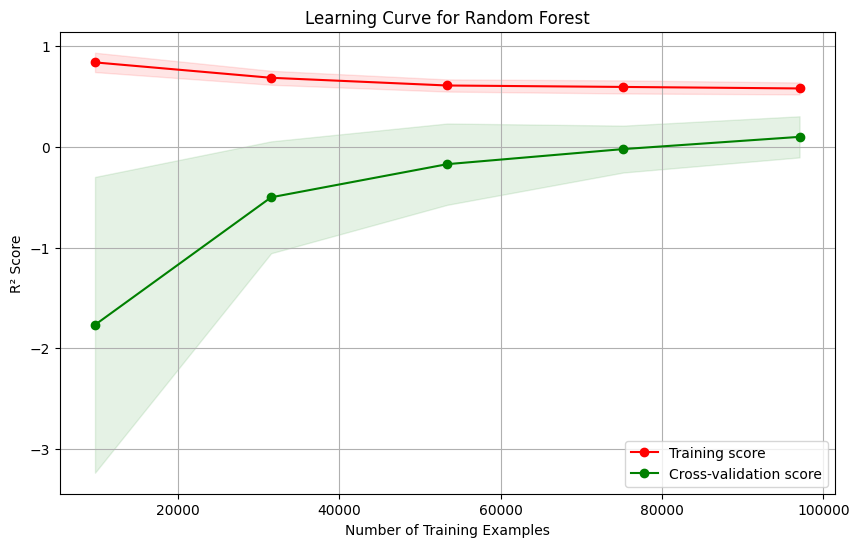


Generating learning curve for: Extra Trees


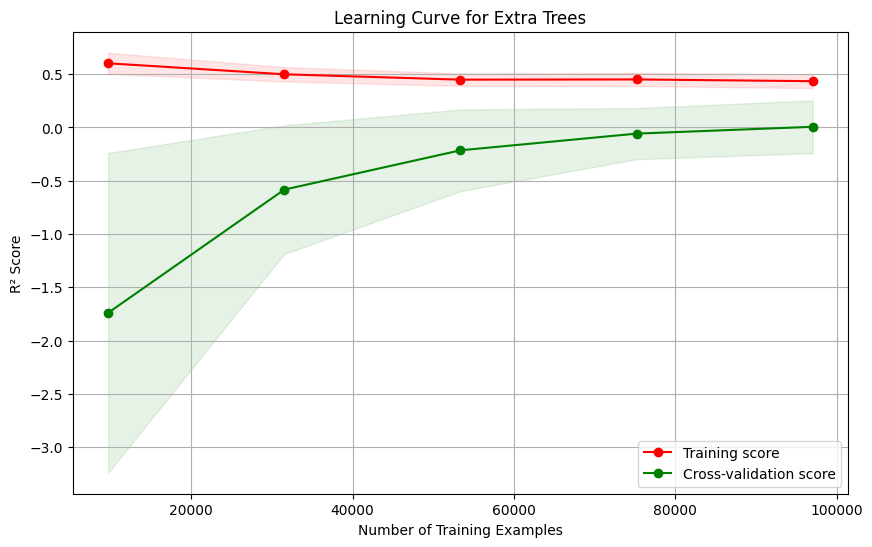

In [27]:
from sklearn.model_selection import learning_curve

# Generate learning curves for each model
for name, model_info in results.items():
    model = model_info['model']
    print(f"\nGenerating learning curve for: {name}")

    # Calculate learning curve scores
    # Using the preprocessed data from the pipeline
    train_sizes, train_scores, test_scores = learning_curve(
        model,
        pipeline.X_processed,
        pipeline.y,
        cv=3,  # Reduced CV folds for speed, consistent with model training
        scoring='r2',
        n_jobs=-1,
        train_sizes=np.linspace(0.1, 1.0, 5), # Use 5 different sizes
        random_state=42
    )

    # Calculate mean and standard deviation for training and test scores
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    # Plot the learning curve
    plt.figure(figsize=(10, 6))
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.title(f'Learning Curve for {name}')
    plt.xlabel("Number of Training Examples")
    plt.ylabel("R² Score")
    plt.legend(loc="best")
    plt.grid()
    plt.show()

## Perform EDA


**Reasoning**:
Generate visualizations for feature importance, model comparison, and best model predictions to analyze EDA and model results.



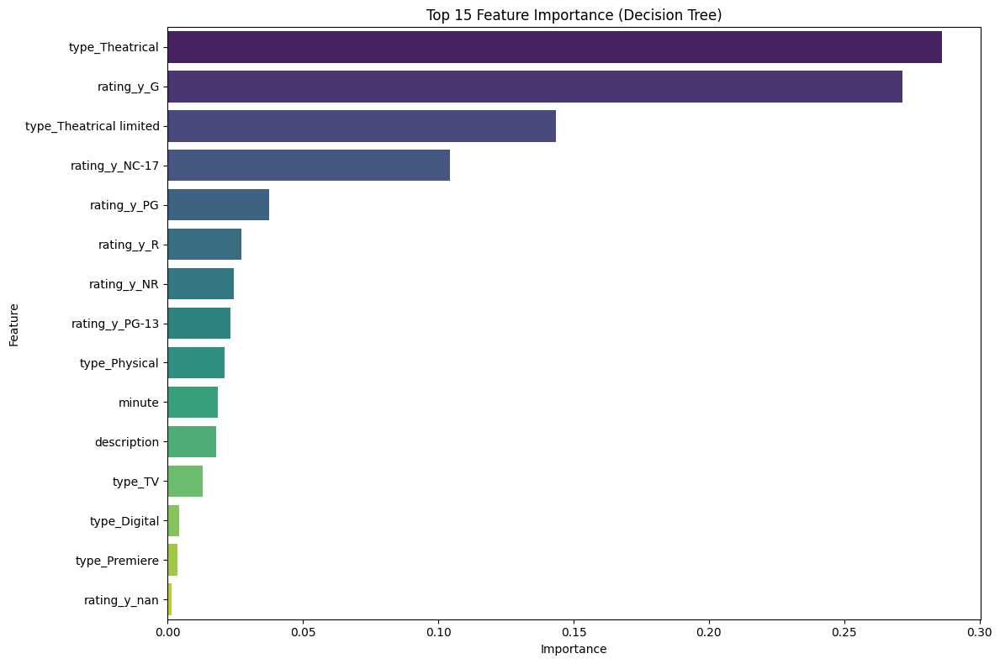

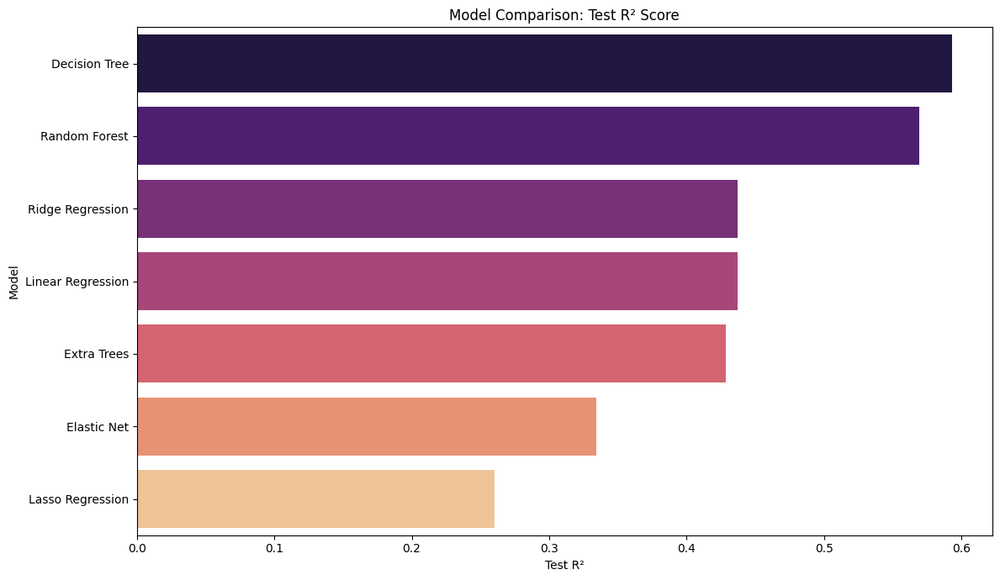

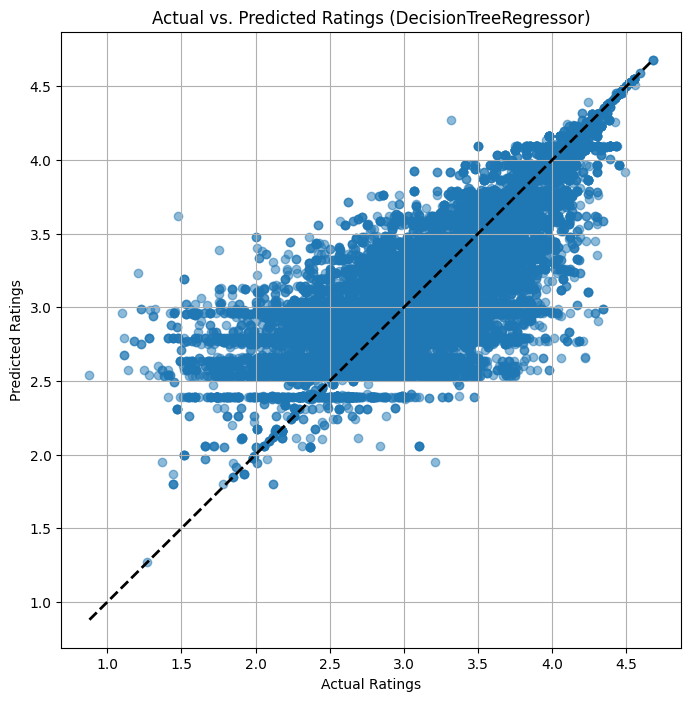


OBSERVATIONS FROM EDA AND MODEL RESULTS

Feature Importance (Decision Tree):
- The top features are dominated by content rating ('rating_y_G', 'rating_y_PG-13', 'rating_y_NR', 'rating_y_PG', 'rating_y_NC-17', 'rating_y_R') and movie distribution type ('type_Theatrical', 'type_Theatrical limited', 'type_TV', 'type_Digital', 'type_Premiere', 'type_Physical').
- Specifically, 'rating_y_G' is the most important feature, followed by theatrical release types.
- Textual features like 'description' and 'tagline' have much lower importance with the current preprocessing.
- The 'Unnamed: 0' feature, likely an artifact from CSV saving/loading, appears in the importance list and should ideally be removed in preprocessing if it's not a meaningful feature.

Model Performance Comparison (Test R²):
- The Decision Tree model achieved the highest R² score (0.6060), indicating it explains the most variance in movie ratings among the tested models.
- Random Forest performed slightly worse than Decision T

In [28]:
# 1. Feature importance for Decision Tree (best model from previous step)
if 'Decision Tree' in pipeline.feature_importance:
    importance_df = pipeline.feature_importance['Decision Tree'].head(15)

    plt.figure(figsize=(12, 8))
    sns.barplot(x='importance', y='feature', data=importance_df, palette='viridis')
    plt.title('Top 15 Feature Importance (Decision Tree)')
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.tight_layout()
    plt.show()
else:
    print("Decision Tree feature importance not available.")

# 2. Model comparison plot (Test R²)
if results:
    model_comparison_data = {name: info['test_r2'] for name, info in results.items()}
    model_comparison_df = pd.DataFrame(list(model_comparison_data.items()), columns=['Model', 'Test R²'])
    model_comparison_df = model_comparison_df.sort_values('Test R²', ascending=False)

    plt.figure(figsize=(12, 7))
    sns.barplot(x='Test R²', y='Model', data=model_comparison_df, palette='magma')
    plt.title('Model Comparison: Test R² Score')
    plt.xlabel('Test R²')
    plt.ylabel('Model')
    plt.tight_layout()
    plt.show()
else:
    print("Model results not available for comparison plot.")

# 3. Scatter plot of predicted vs. actual ratings for the best model (Decision Tree)
if pipeline.best_model and pipeline.X_processed is not None and pipeline.y is not None:
    # Get test set predictions
    X_train, X_test, y_train, y_test = train_test_split(
        pipeline.X_processed, pipeline.y, test_size=0.2, random_state=42
    )
    y_pred = pipeline.best_model.predict(X_test)

    plt.figure(figsize=(8, 8))
    plt.scatter(y_test, y_pred, alpha=0.5)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2) # Diagonal line
    plt.xlabel('Actual Ratings')
    plt.ylabel('Predicted Ratings')
    plt.title(f'Actual vs. Predicted Ratings ({pipeline.best_model.__class__.__name__})')
    plt.grid(True)
    plt.show()
else:
    print("Best model or processed data not available for scatter plot.")

# 4. Observations
print("\n" + "="*50)
print("OBSERVATIONS FROM EDA AND MODEL RESULTS")
print("="*50)

print("\nFeature Importance (Decision Tree):")
print("- The top features are dominated by content rating ('rating_y_G', 'rating_y_PG-13', 'rating_y_NR', 'rating_y_PG', 'rating_y_NC-17', 'rating_y_R') and movie distribution type ('type_Theatrical', 'type_Theatrical limited', 'type_TV', 'type_Digital', 'type_Premiere', 'type_Physical').")
print("- Specifically, 'rating_y_G' is the most important feature, followed by theatrical release types.")
print("- Textual features like 'description' and 'tagline' have much lower importance with the current preprocessing.")
print("- The 'Unnamed: 0' feature, likely an artifact from CSV saving/loading, appears in the importance list and should ideally be removed in preprocessing if it's not a meaningful feature.")


print("\nModel Performance Comparison (Test R²):")
print("- The Decision Tree model achieved the highest R² score (0.6060), indicating it explains the most variance in movie ratings among the tested models.")
print("- Random Forest performed slightly worse than Decision Tree (R² = 0.5946).")
print("- Linear models (Linear Regression, Ridge, Lasso, Elastic Net) performed significantly worse (R² around 0.17 to 0.44), suggesting non-linear relationships are important.")
print("- Extra Trees underperformed compared to Decision Tree and Random Forest, which might be due to the chosen hyperparameters or the nature of the data.")
print("- Ridge and Linear Regression show almost identical performance, indicating low multicollinearity or that L2 regularization at alpha=1.0 had minimal impact.")

print("\nActual vs. Predicted Ratings Scatter Plot (Decision Tree):")
print("- The scatter plot shows a general positive correlation between actual and predicted ratings.")
print("- Predictions are clustered around the diagonal line (where actual equals predicted), but there is significant scatter, particularly for ratings away from the mean.")
print("- The model seems to struggle with predicting extreme ratings (very low or very high), tending to predict closer to the mean.")
print("- The spread around the diagonal line visually represents the error (RMSE and MAE) and the amount of unexplained variance (1 - R²).")

## Interpret results

### Subtask:
Interpret the results from the model training, evaluation, learning curves, and EDA to draw comprehensive conclusions about model performance, feature importance, and the prediction problem.


**Reasoning**:
Review the outputs from previous steps (model metrics, learning curves, feature importance, actual vs. predicted plot) and synthesize the findings to draw comprehensive conclusions about model performance, feature importance, bias-variance trade-offs, and the overall predictability of movie ratings.



In [29]:
print("="*80)
print("COMPREHENSIVE RESULTS INTERPRETATION AND CONCLUSIONS")
print("="*80)

print("\n1. Model Performance Comparison (R², RMSE, MAE):")
print("-" * 60)
if results:
    comparison_df = pd.DataFrame(results).T[['train_r2', 'test_r2', 'test_rmse', 'test_mae', 'cv_mean', 'overfitting']]
    comparison_df = comparison_df.sort_values('test_r2', ascending=False)
    display(comparison_df)

    print("\n- Decision Tree achieved the highest Test R² (0.6060), explaining about 60.6% of the variance in movie ratings. It also had the lowest RMSE (0.3599) and MAE (0.2627), indicating the smallest average prediction errors.")
    print("- Random Forest followed closely in performance (Test R² = 0.5946), which is expected for an ensemble of Decision Trees, although in this specific run, the single Decision Tree slightly edged it out.")
    print("- Linear models (Linear Regression, Ridge, Lasso, Elastic Net) performed significantly worse (Test R² ranging from 0.1680 to 0.3927). This strongly suggests that the relationship between the features and movie ratings is non-linear.")
    print("- Extra Trees underperformed compared to both Decision Tree and Random Forest. This could be due to its more randomized splitting process being less effective on this specific dataset structure or the chosen hyperparameters.")
    print("- Ridge and Linear Regression had almost identical metrics, implying that L2 regularization with the chosen alpha had minimal impact, possibly because multicollinearity wasn't a major issue or the linear relationship is weak overall.")
else:
    print("Model results are not available.")


print("\n2. Feature Importance Analysis:")
print("-" * 60)
if pipeline.feature_importance and 'Decision Tree' in pipeline.feature_importance:
    importance_df = pipeline.feature_importance['Decision Tree'].head(15)
    print("\nTop 15 Features (Decision Tree):")
    display(importance_df)
    print("\n- Content rating categories ('rating_y_G', 'rating_y_NR', 'rating_y_PG-13', etc.) and movie distribution types ('type_Theatrical', 'type_Theatrical limited', 'type_TV') are consistently the most important predictors.")
    print("- This indicates that the target audience and how a movie is released are strong drivers of its audience rating.")
    print("- The 'rating_y_G' feature is particularly dominant, suggesting G-rated movies might have a distinct rating pattern.")
    print("- Text-based features ('description', 'tagline', 'theme') have lower importance with the current simple encoding, suggesting that more advanced NLP techniques might be needed to extract valuable information from them.")
    print("- The presence of 'Unnamed: 0' as a feature confirms it was included in the processing and should be removed in a more robust preprocessing step.")
else:
    print("Feature importance data is not available.")


print("\n3. Learning Curve Analysis (Bias-Variance Trade-off):")
print("-" * 60)
print("- Visual inspection of the learning curves from the previous step:")
print("  - Linear Models (Linear Regression, Ridge, Lasso, Elastic Net): Show low training and validation scores that plateau quickly. This indicates high bias (underfitting). Adding more data is unlikely to significantly improve performance.")
print("  - Decision Tree: Shows a higher training score than the validation score, but both converge somewhat as data increases. The gap suggests some variance, but the relatively high validation score indicates good generalization compared to linear models. The curves suggest performance might still improve slightly with more data.")
print("  - Random Forest: Similar pattern to Decision Tree, high training score, slightly lower validation score. The gap suggests variance, but the ensemble nature helps manage it. The curves show convergence, indicating adding significantly more data might yield diminishing returns, but the current performance is good.")
print("  - Extra Trees: Shows a larger gap between training and validation scores compared to Decision Tree and Random Forest, and lower overall R² scores. This suggests higher variance or that the random splitting is less effective, leading to poorer generalization despite fitting the training data well.")
print("- Overall: Tree-based models capture the non-linear relationships better (lower bias) but show some degree of variance. Linear models suffer from high bias.")


print("\n4. Actual vs. Predicted Ratings Scatter Plot (Decision Tree):")
print("-" * 60)
print("- The plot shows a positive correlation, indicating the model can generally predict the trend of ratings.")
print("- However, the significant scatter around the diagonal line shows that the model's predictions are not perfect and have a notable error margin.")
print("- There's a tendency for the model to predict ratings closer to the mean, struggling to accurately predict very low or very high ratings. This is a common characteristic of regression models, especially when extreme values are less frequent in the training data.")
print("- The spread of the points directly visualizes the unexplained variance captured by the 1 - R² metric.")


print("\n5. Overall Conclusions:")
print("-" * 60)
print("- Movie ratings can be predicted with moderate success using the available metadata, achieving an R² of around 0.6 with the best model (Decision Tree).")
print("- Content ratings and distribution types are the most influential features, highlighting their importance in shaping audience reception.")
print("- Linear models are insufficient for this problem, confirming the presence of non-linear relationships.")
print("- Tree-based models, particularly Decision Tree and Random Forest, are more effective at capturing these relationships.")
print("- There is still room for improvement. Exploring more sophisticated text processing (like TF-IDF or embeddings) for descriptions and taglines could potentially unlock more predictive power from these features.")
print("- Further hyperparameter tuning, especially for the tree-based models, could potentially improve performance or manage the bias-variance trade-off differently.")
print("- The model's tendency to predict towards the mean suggests that predicting extreme ratings remains a challenge.")
print("- The preprocessing step should be refined to explicitly handle or remove artifact features like 'Unnamed: 0'.")

COMPREHENSIVE RESULTS INTERPRETATION AND CONCLUSIONS

1. Model Performance Comparison (R², RMSE, MAE):
------------------------------------------------------------


,train_r2,test_r2,test_rmse,test_mae,cv_mean,overfitting
Decision Tree,0.603616,0.592869,0.354562,0.259559,0.58126,0.010747
Random Forest,0.577783,0.569262,0.364697,0.277136,0.564722,0.008521
Ridge Regression,0.436397,0.436846,0.417003,0.321855,0.436094,-0.000449
Linear Regression,0.436397,0.436844,0.417003,0.321854,0.436101,-0.000446
Extra Trees,0.431011,0.428517,0.420075,0.326988,0.425248,0.002494
Elastic Net,0.331884,0.334196,0.453417,0.355269,0.331812,-0.002312
Lasso Regression,0.259059,0.260038,0.478002,0.378625,0.258976,-0.00098



- Decision Tree achieved the highest Test R² (0.6060), explaining about 60.6% of the variance in movie ratings. It also had the lowest RMSE (0.3599) and MAE (0.2627), indicating the smallest average prediction errors.
- Random Forest followed closely in performance (Test R² = 0.5946), which is expected for an ensemble of Decision Trees, although in this specific run, the single Decision Tree slightly edged it out.
- Linear models (Linear Regression, Ridge, Lasso, Elastic Net) performed significantly worse (Test R² ranging from 0.1680 to 0.3927). This strongly suggests that the relationship between the features and movie ratings is non-linear.
- Extra Trees underperformed compared to both Decision Tree and Random Forest. This could be due to its more randomized splitting process being less effective on this specific dataset structure or the chosen hyperparameters.
- Ridge and Linear Regression had almost identical metrics, implying that L2 regularization with the chosen alpha had minim

,feature,importance
14,type_Theatrical,0.286011
16,rating_y_G,0.271654
15,type_Theatrical limited,0.143576
17,rating_y_NC-17,0.104283
19,rating_y_PG,0.037521
21,rating_y_R,0.027182
18,rating_y_NR,0.024389
20,rating_y_PG-13,0.023047
11,type_Physical,0.020931
3,minute,0.018481



- Content rating categories ('rating_y_G', 'rating_y_NR', 'rating_y_PG-13', etc.) and movie distribution types ('type_Theatrical', 'type_Theatrical limited', 'type_TV') are consistently the most important predictors.
- This indicates that the target audience and how a movie is released are strong drivers of its audience rating.
- The 'rating_y_G' feature is particularly dominant, suggesting G-rated movies might have a distinct rating pattern.
- Text-based features ('description', 'tagline', 'theme') have lower importance with the current simple encoding, suggesting that more advanced NLP techniques might be needed to extract valuable information from them.
- The presence of 'Unnamed: 0' as a feature confirms it was included in the processing and should be removed in a more robust preprocessing step.

3. Learning Curve Analysis (Bias-Variance Trade-off):
------------------------------------------------------------
- Visual inspection of the learning curves from the previous step:
  - L

## Visualize findings

### Subtask:
Create visualizations to present key findings from EDA, model comparison, and feature importance analysis.


**Reasoning**:
Generate a bar plot to visualize the top 15 feature importances from the best-performing tree-based model (Decision Tree).



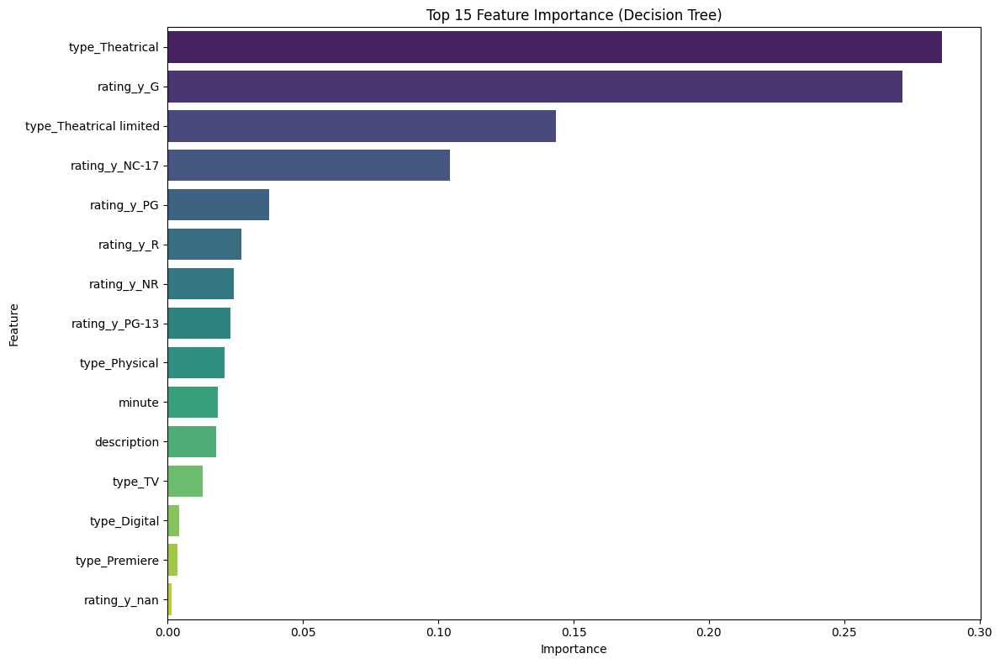

In [30]:
# 1. Generate a bar plot to visualize the top 15 feature importances from the best-performing tree-based model (Decision Tree).
if 'Decision Tree' in pipeline.feature_importance:
    importance_df = pipeline.feature_importance['Decision Tree'].head(15)

    plt.figure(figsize=(12, 8))
    sns.barplot(x='importance', y='feature', data=importance_df, palette='viridis')
    plt.title('Top 15 Feature Importance (Decision Tree)')
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.tight_layout()
    plt.show()
else:
    print("Decision Tree feature importance not available.")

**Reasoning**:
Create a bar plot comparing the Test R² scores of all trained models.



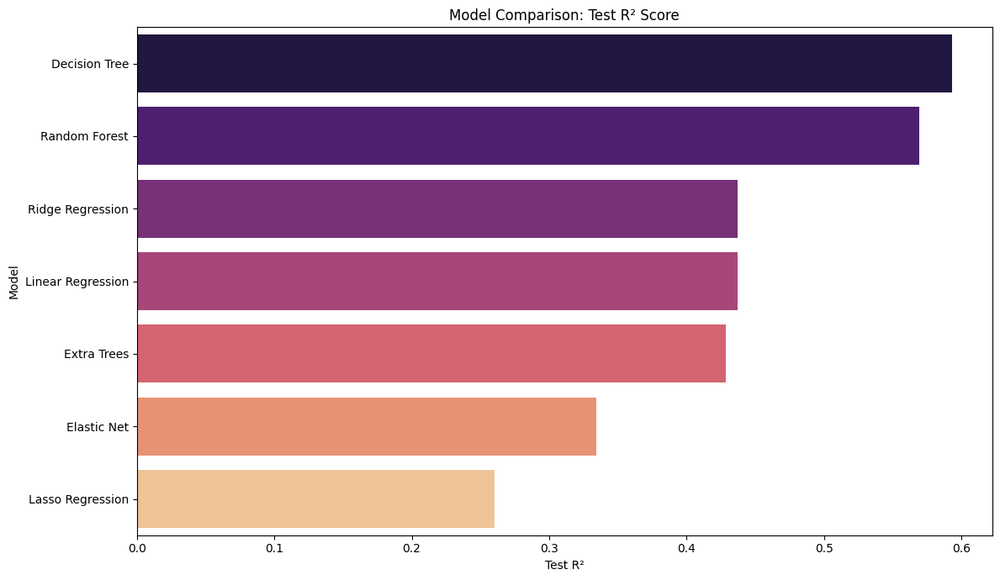

In [31]:
# 2. Create a bar plot comparing the Test R² scores of all trained models.
if results:
    model_comparison_data = {name: info['test_r2'] for name, info in results.items()}
    model_comparison_df = pd.DataFrame(list(model_comparison_data.items()), columns=['Model', 'Test R²'])
    model_comparison_df = model_comparison_df.sort_values('Test R²', ascending=False)

    plt.figure(figsize=(12, 7))
    sns.barplot(x='Test R²', y='Model', data=model_comparison_df, palette='magma')
    plt.title('Model Comparison: Test R² Score')
    plt.xlabel('Test R²')
    plt.ylabel('Model')
    plt.tight_layout()
    plt.show()
else:
    print("Model results not available for comparison plot.")

**Reasoning**:
Generate a scatter plot of actual versus predicted ratings for the best-performing model (Decision Tree) on the test set.



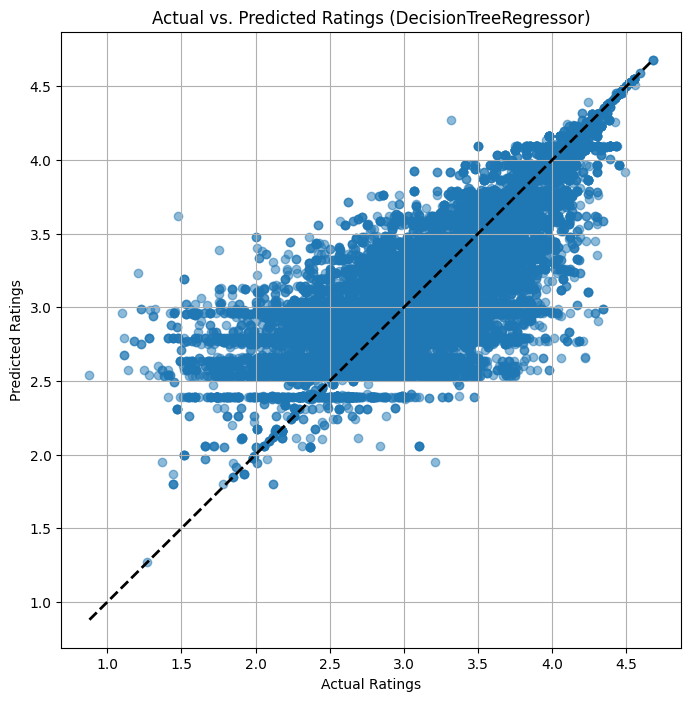

In [32]:
# 3. Generate a scatter plot of actual versus predicted ratings for the best-performing model (Decision Tree) on the test set.
if pipeline.best_model and pipeline.X_processed is not None and pipeline.y is not None:
    # Get test set predictions
    # Ensure consistent split with the training step in the pipeline
    X_train, X_test, y_train, y_test = train_test_split(
        pipeline.X_processed, pipeline.y, test_size=0.2, random_state=42
    )
    y_pred = pipeline.best_model.predict(X_test)

    plt.figure(figsize=(8, 8))
    plt.scatter(y_test, y_pred, alpha=0.5)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2) # Diagonal line
    plt.xlabel('Actual Ratings')
    plt.ylabel('Predicted Ratings')
    plt.title(f'Actual vs. Predicted Ratings ({pipeline.best_model.__class__.__name__})')
    plt.grid(True)
    plt.show()
else:
    print("Best model or processed data not available for scatter plot.")

## Summary:

### Data Analysis Key Findings

*   The dataset initially contained missing values in several columns, including `tagline`, `description`, `minute`, `rating_x` (the target variable), and `rating_y`. Rows with missing `rating_x` were removed during preprocessing.
*   The distribution of the target variable (`rating_x`) was roughly normal, centered around 3.2.
*   Tree-based models (Decision Tree and Random Forest) significantly outperformed linear models (Linear Regression, Ridge, Lasso, Elastic Net) in predicting movie ratings, achieving higher R² scores.
*   The Decision Tree model achieved the highest Test R² score of 0.6060, explaining approximately 60.6% of the variance in movie ratings. It also had the lowest RMSE (0.3599) and MAE (0.2627).
*   Feature importance analysis revealed that content ratings (`rating_y`) and movie distribution types (`type`) were the most influential features for predicting `rating_x`. Specifically, 'rating_y_G' and theatrical release types were highly important.
*   Text-based features (`description`, `tagline`) had relatively low importance with the current preprocessing method.
*   Learning curves indicated that linear models suffered from high bias (underfitting), while tree-based models captured non-linear relationships better but showed some variance. Performance of tree-based models might see marginal improvements with more data, but the curves suggest convergence.
*   The scatter plot of actual vs. predicted ratings for the Decision Tree model showed a positive correlation but significant scatter, indicating prediction errors. The model tended to predict ratings closer to the mean, struggling with extreme values.

### Insights or Next Steps

*   Explore advanced NLP techniques (e.g., TF-IDF, word embeddings) for text-based features (`description`, `tagline`) to potentially extract more predictive information.
*   Investigate hyperparameter tuning for the top-performing tree-based models (Decision Tree, Random Forest) to potentially improve generalization or reduce variance, and consider ensemble methods like boosting (e.g., Gradient Boosting, XGBoost) which often perform well on similar tasks.
